In [4]:
import cv2
import numpy as np
from pathlib import Path
import yaml
from PIL import Image
from hfnet.datasets.aachen import Aachen
from hfnet.evaluation.localization import Localization
from hfnet.evaluation.utils.db_management import read_query_list
from hfnet.evaluation.loaders import export_loader,export_loader_db
from hfnet.settings import DATA_PATH,EXPER_PATH

from notebooks.utils import plot_matches
from notebooks.utils import plot_keypoints
import operator
from functools import reduce
from pyquaternion import Quaternion

In [5]:
config_global = {
    'db_name': 'globaldb_netvlad.pkl',
    'experiment': 'netvlad/aachen',
    'predictor': export_loader, 
    'has_keypoints': False, 
    'has_descriptors': False, 
    'pca_dim': 4096,
    'num_prior': 10,
}
config_local = {
    'db_name': 'localdb_superpoint_seq.pkl',
    'experiment': 'superpoint/aachen',
    'predictor': export_loader,
    'has_keypoints': True,
    'has_descriptors': True,
#    'do_nms': True,
#    'nms_thresh': 4,
    'num_features': 2000,
    'ratio_thresh': 0.9,
}
config_pose = {
    'reproj_error': 10,
    'min_inliers': 12,
} 

model = 'cam03_seq'

[01/20/2021 15:13:06 INFO] Importing COLMAP model cam03_seq
[01/20/2021 15:13:15 INFO] Number of images: 7303
Number of points: 360519
Median keypoints per image: 1709.0
Ratio of matched keypoints: 0.184

[01/20/2021 15:13:15 INFO] Importing global and local databases
[01/20/2021 15:13:59 INFO] Indexing descriptors


77 Success, inliers  32 , ratio 0.032, landmarks  572, spl  0, places [10], pos ['51.3', '129.3', '-3.5']
QUERT IMAGE---query/1606405183.30648344.png


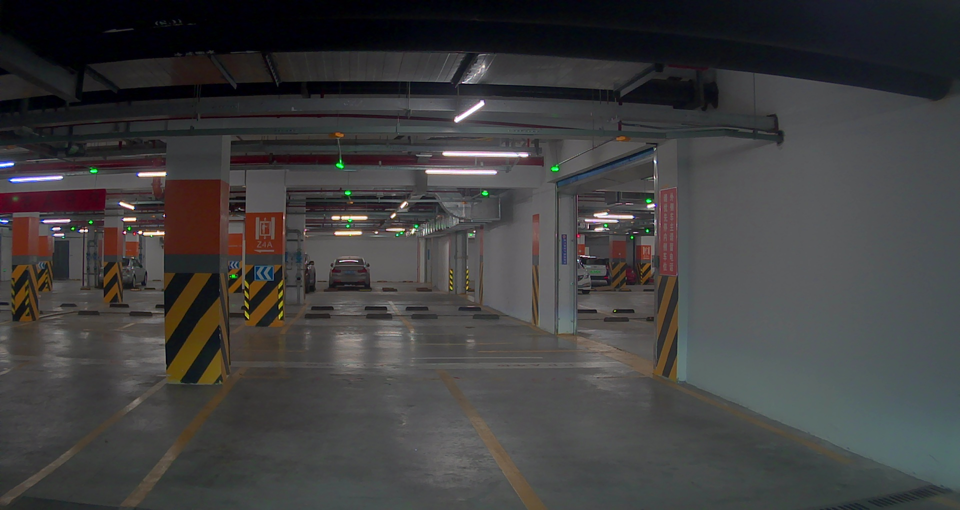

TOP K 
[791, 781, 784, 794, 795, 796, 801, 802, 804, 773]
['1606404283.66586890.png', '1606404282.60717673.png', '1606404282.90657360.png', '1606404283.90884898.png', '1606404284.06290453.png', '1606404284.10847526.png', '1606404284.67114405.png', '1606404284.77107706.png', '1606404284.90846112.png', '1606404281.80748107.png']
1606404283.66586890.png
1606404282.60717673.png
1606404282.90657360.png
1606404283.90884898.png
1606404284.06290453.png
1606404284.10847526.png
1606404284.67114405.png
1606404284.77107706.png
1606404284.90846112.png
1606404281.80748107.png
FINAL_IMAGE:1606404282.90657360.png


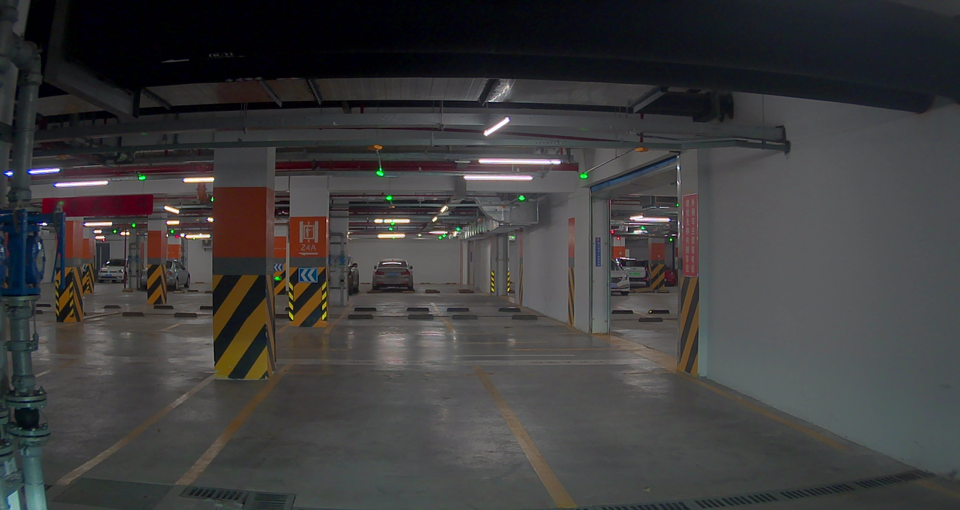

inliers:5
outliers:114
119
[0.05370692484467645, 0.0518167420454986, 0.7061553273840641, -0.7041130911115231] [31.54192338930269, -3.73244724656496, 135.476287256705]
261 Success, inliers  21 , ratio 0.029, landmarks  330, spl  0, places [10], pos ['-107.4', '132.2', '-3.4']
QUERT IMAGE---query/1606405397.90701330.png


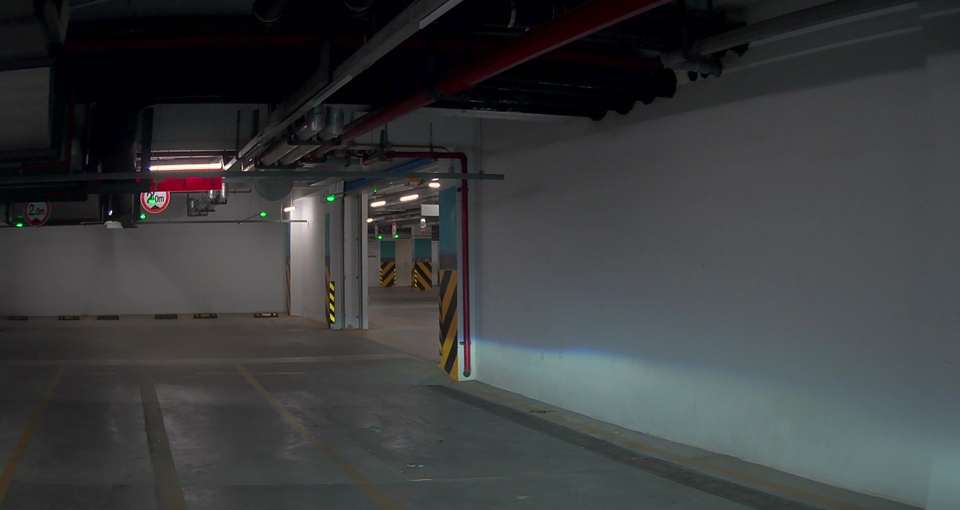

TOP K 
[2806, 2782, 2807, 2811, 2812, 2813, 2814, 2784, 2817, 2788]
['1606404484.27116815.png', '1606404481.80973089.png', '1606404484.37145413.png', '1606404484.77015995.png', '1606404484.87109580.png', '1606404484.90872846.png', '1606404485.00809702.png', '1606404482.00972371.png', '1606404485.30729059.png', '1606404482.40880432.png']
1606404484.27116815.png
1606404481.80973089.png
1606404484.37145413.png
1606404484.77015995.png
1606404484.87109580.png
1606404484.90872846.png
1606404485.00809702.png
1606404482.00972371.png
1606404485.30729059.png
1606404482.40880432.png
FINAL_IMAGE:1606404484.27116815.png


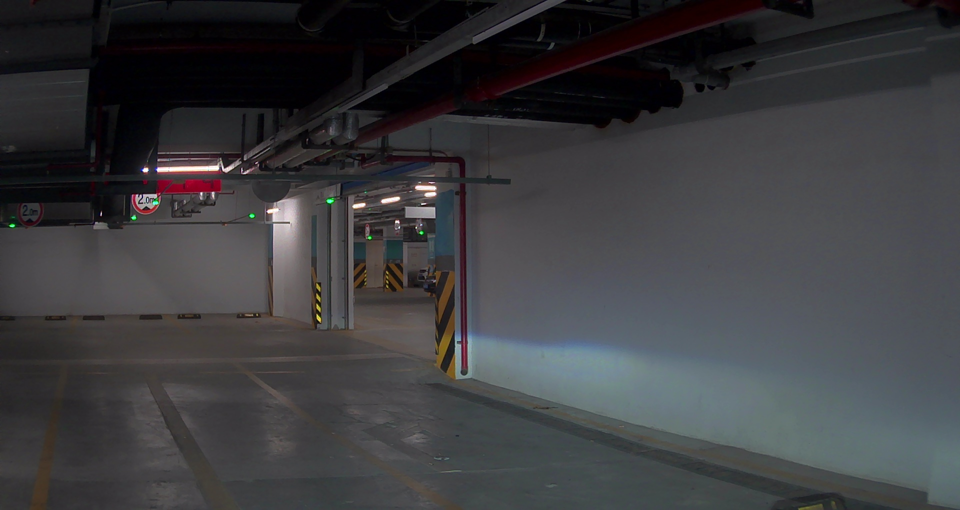

inliers:5
outliers:76
81
[0.09633836138384537, 0.18206941330329976, 0.6954555476902503, -0.6884121077175512] [-149.72988724679598, 11.483900833790452, 80.49895526152055]
356 Success, inliers  14 , ratio 0.045, landmarks   79, spl  2, places [6, 3, 1], pos ['-136.3', '102.0', '-3.6']
QUERT IMAGE---query/1606405508.60563947.png


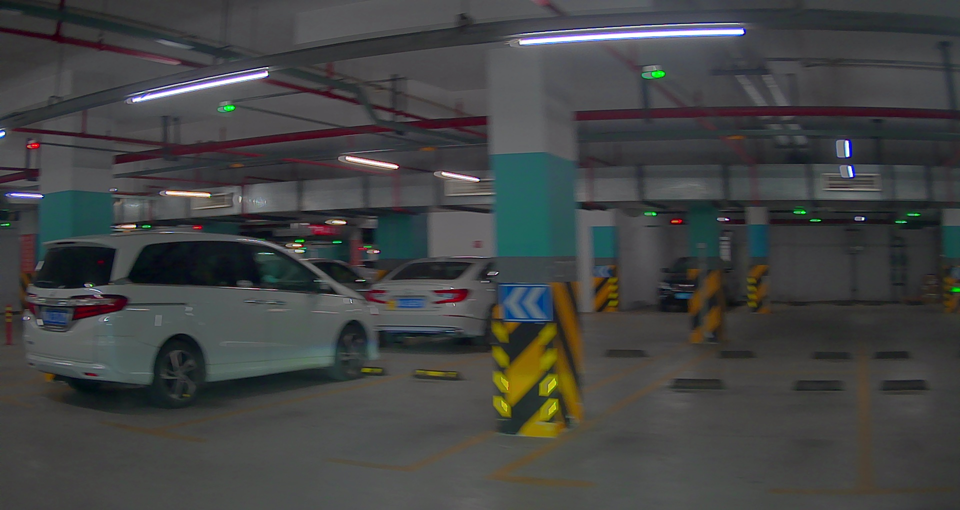

TOP K 
[3352, 3353, 3355, 3356, 3357, 3351, 3885, 3886, 3887, 3881]
['1606404537.80547993.png', '1606404537.90719198.png', '1606404538.10747842.png', '1606404538.20646110.png', '1606404538.30499600.png', '1606404537.76725588.png', '1606404591.16935138.png', '1606404591.26944581.png', '1606404591.37028672.png', '1606404590.70469091.png']
1606404537.80547993.png
1606404537.90719198.png
1606404538.10747842.png
1606404538.20646110.png
1606404538.30499600.png
1606404537.76725588.png
1606404591.16935138.png
1606404591.26944581.png
1606404591.37028672.png
1606404590.70469091.png
FINAL_IMAGE:1606404590.70469091.png


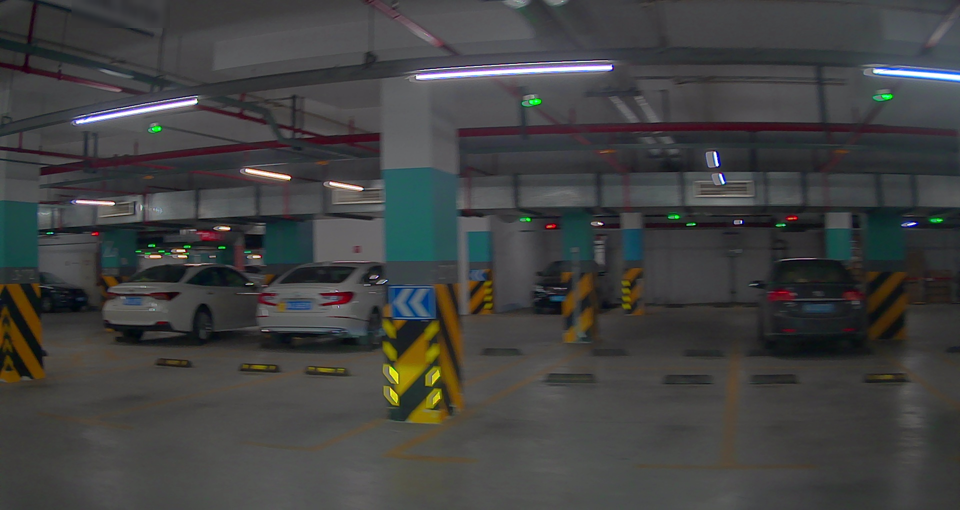

inliers:14
outliers:296
310
[0.5885960920577046, 0.5884964514970016, -0.389429835043577, 0.3944248604839303] [146.71229389733043, -2.3881122569090234, 86.48408617712919]


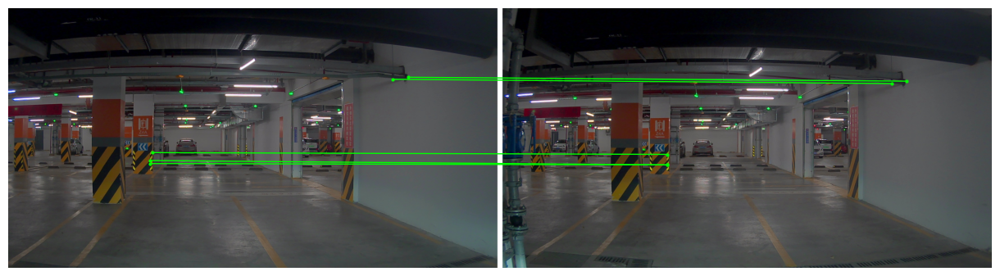

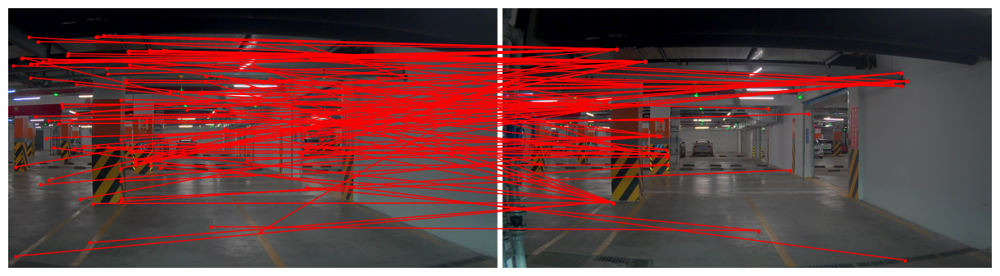

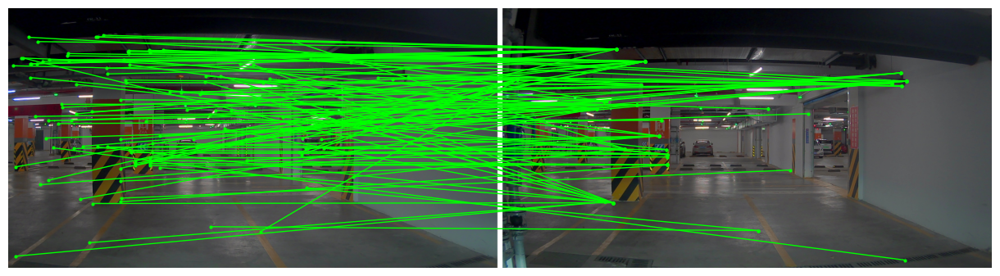

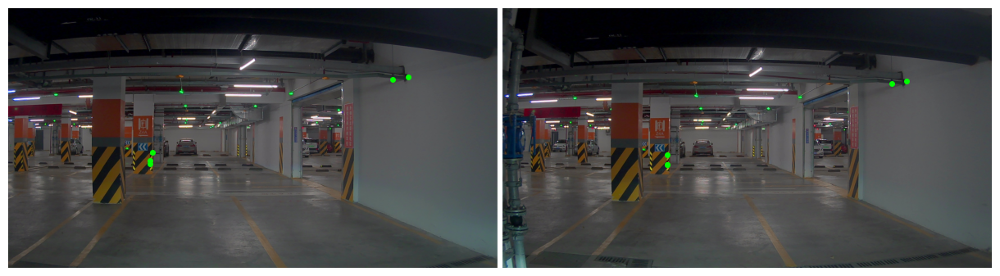

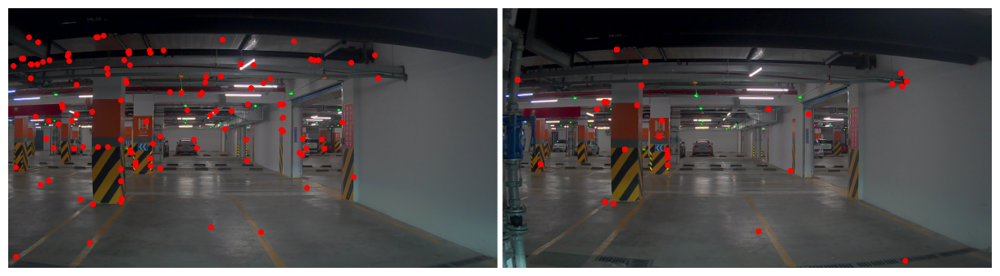

...

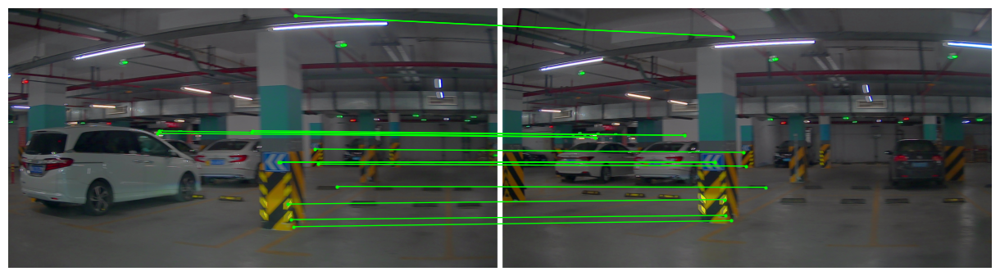

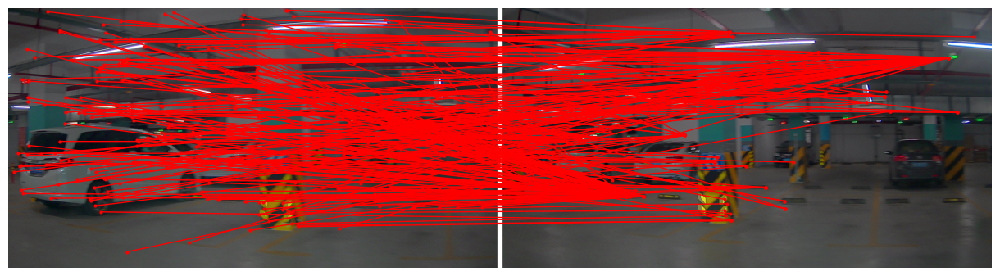

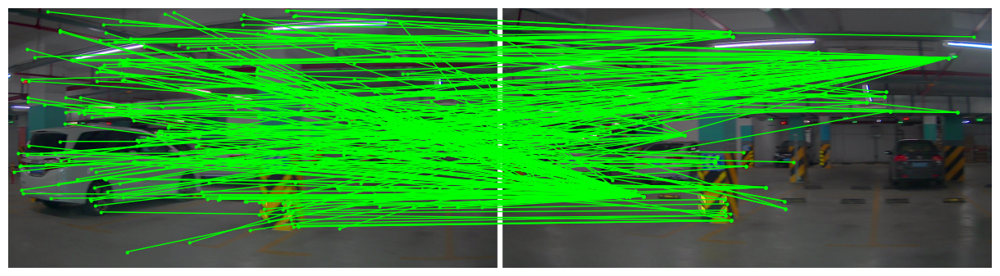

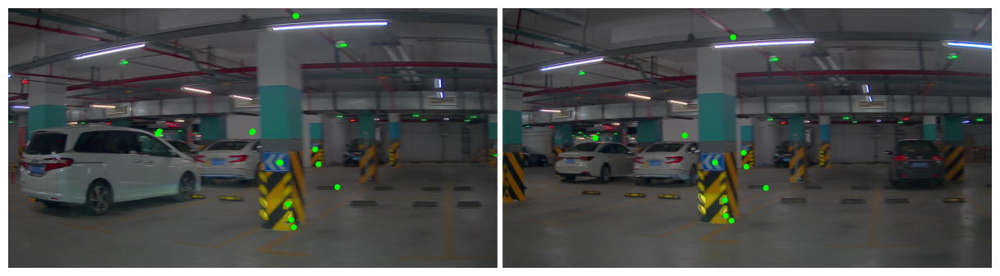

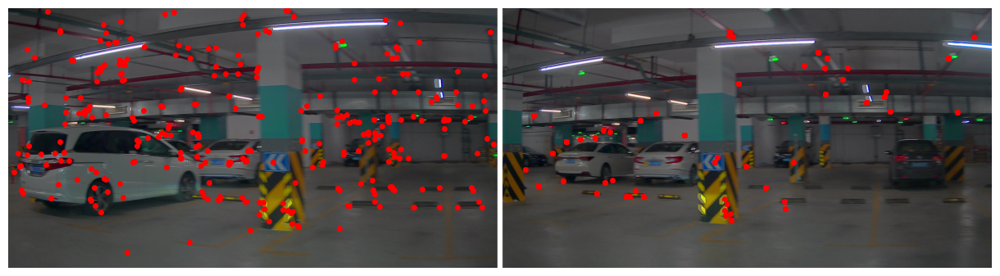

In [6]:
config = {'global': config_global, 'local': config_local, 'pose': config_pose}
loc = Localization('aachen', model, config)
queries = read_query_list(Path(loc.base_path, 'cam03.txt'))

q_name=['query/1606405397.90701330.png','query/1606405183.30648344.png','query/1606405508.60563947.png']
# query_dataset = Aachen(**{'resize_max': 1920,
#                           'image_names': q_name})
query_dataset = Aachen(**{'resize_max':1920,
                          'image_names': [q.name for q in queries]})

def get_image(name):
    path = Path(DATA_PATH, query_dataset.dataset_folder,name)
    return cv2.imread(path.as_posix())[..., ::-1]
def get_image2(name):
    path = Path(DATA_PATH, query_dataset.dataset_folder,'db',name)
    return cv2.imread(path.as_posix())[..., ::-1]

query_iter = query_dataset.get_test_set()
for i, query_info, query_data in zip(range(0,len(queries)), queries, query_iter):
    if query_info.name in q_name: 
        
        results, debug = loc.localize(query_info, query_data, debug=True)

        s = f'{i} {"Success" if results.success else "Failure"}, inliers {results.num_inliers:^4}, ' \
            + f'ratio {results.inlier_ratio:.3f}, landmarks {len(debug["matching"]["lm_frames"]):>4}, ' \
            + f'spl {debug["index_success"]:>2}, places {[len(p) for p in debug["places"]]:}, ' \
            + f'pos {[f"{n:.1f}" for n in results.T[:3, 3]]}'
        print(s)
        query_T_w = np.linalg.inv(results.T)
        qvec_nvm = list(Quaternion(matrix=query_T_w))
        pos_nvm = query_T_w[:3, 3].tolist()
        print("QUERT IMAGE---"+query_info.name)
        path_query=Path(DATA_PATH,'aachen/image',query_info.name)
        display(Image.open(path_query).resize((960,510)))

        p=reduce(operator.add, debug["places"])
        print("TOP K ")
        print(p)
        for k in range(0,len(p)):
            p[k]=loc.images[p[k]].name
        print(p)


        for pname in p:
            path_topk=Path(DATA_PATH, 'aachen/image/db',pname)
#             display(Image.open(path_topk).resize((480,260)))
            print(pname)

        sorted_frames, counts = np.unique(
            [debug['matching']['lm_frames'][m2] for m1, m2 in debug['matches'][debug['inliers']]],
            return_counts=True)

        best_id = sorted_frames[np.argmax(counts)]


        query_image = get_image(query_info.name)

        best_image = get_image2(loc.images[best_id].name)


        print("FINAL_IMAGE:"+loc.images[best_id].name)
        path_final=Path(DATA_PATH,'aachen/image/db',loc.images[best_id].name)
        display(Image.open(path_final).resize((960,510)))

        best_matches_inliers = [(m1, debug['matching']['lm_indices'][m2]) 
                                for m1, m2 in debug['matches'][debug['inliers']] 
                                if debug['matching']['lm_frames'][m2] == best_id]
        print("inliers:"+len(best_matches_inliers).__str__())

        best_matches_outliers = [(m1, debug['matching']['lm_indices'][m2])
                                for i, (m1, m2) in enumerate(debug['matches']) 
                                if debug['matching']['lm_frames'][m2] == best_id
                                and i not in debug['inliers']]
        print("outliers:"+len(best_matches_outliers).__str__())
        all_matches=best_matches_inliers+best_matches_outliers
        print(len(all_matches))

        plot_matches(
            query_image, debug['query_item'].keypoints,
            best_image, loc.local_db[best_id].keypoints,
            np.array(best_matches_inliers), color=(0, 1., 0),
            dpi=100, ylabel=str(i), thickness=1.)
        
        plot_matches(
            query_image, debug['query_item'].keypoints,
            best_image, loc.local_db[best_id].keypoints,
            np.array(best_matches_outliers), color=(1., 0, 0),       
            dpi=100, ylabel=str(i), thickness=1.)
        plot_matches(
            query_image, debug['query_item'].keypoints,
            best_image, loc.local_db[best_id].keypoints,
            np.array(all_matches), color=(0, 1., 0),       
            dpi=100, ylabel=str(i), thickness=1.)
        plot_keypoints(
            query_image, debug['query_item'].keypoints,
            best_image, loc.local_db[best_id].keypoints,
            np.array(best_matches_inliers), color=(0, 1., 0),
            dpi=100, ylabel=str(i), thickness=1.)
        plot_keypoints(
            query_image, debug['query_item'].keypoints,
            best_image, loc.local_db[best_id].keypoints,
            #np.array(best_matches_inliers), color=(0, 1., 0),
            np.array(best_matches_outliers), color=(1., 0, 0),       
            dpi=100, ylabel=str(i), thickness=1.)
        print(qvec_nvm,pos_nvm)